In [1]:
%load_ext autoreload
%autoreload 2

Reading config from config-bvap-bounds_10min.json
In run SC_bvap_0_max using config: {'state': 'SC', 'level': 'county', 'base': 'labeling', 'obj': 'bvap_bounds', 'R': 90, 'dist_bounds': False, 'tlimit': 600, 'fixing': False, 'contiguity': 'lcut', 'symmetry': 'default', 'extended': False, 'order': 'B_decreasing', 'heuristic': True, 'lp': False, 'obj_order': 'bvap_max', 'index': 0}.
../data/county/dual_graphs/county45.json

L = 658084 , U = 804323 , k = 7
Academic license - for non-commercial use only - expires 2023-09-22
Using license file C:\Users\robert\gurobi.lic
{'state': 'SC', 'level': 'county', 'base': 'labeling', 'obj': 'bvap_bounds', 'R': 90, 'dist_bounds': False, 'tlimit': 600, 'fixing': False, 'contiguity': 'lcut', 'symmetry': 'default', 'extended': False, 'order': 'B_decreasing', 'heuristic': True, 'lp': False, 'obj_order': 'bvap_max', 'index': 0, 'run': 'SC_bvap_0_max', 'k': 7, 'L': 658084, 'U': 804323, 'm': 109, 'n': 46, 'heur_obj': 'n/a', 'heur_time': 'n/a', 'heur_iter': '

C:\Users\robert\AppData\Roaming\Python\Python38\site-packages\geopandas\plotting.py:658: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


Presolved: 74 rows, 658 columns, 1624 nonzeros
Variable types: 0 continuous, 658 integer (644 binary)

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Root barrier log...

Ordering time: 0.00s

Barrier statistics:
 AA' NZ     : 9.870e+02
 Factor NZ  : 1.708e+03
 Factor Ops : 5.549e+04 (less than 1 second per iteration)
 Threads    : 1

Barrier performed 0 iterations in 0.05 seconds
Barrier solve interrupted - model solved by another algorithm


Solved with dual simplex

Root relaxation: objective 3.069240e+05, 57 iterations, 0.02 seconds

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0 306924.000    0    4 108679.000 306924.000   182%     -    0s
     0     0 306547.591    0   35 108679.000 306547.591   182%     -    0s
     0     0 305518.022    0   22 108679.000 305518.022   181%     -    0s
     0     0 305518.022    0   

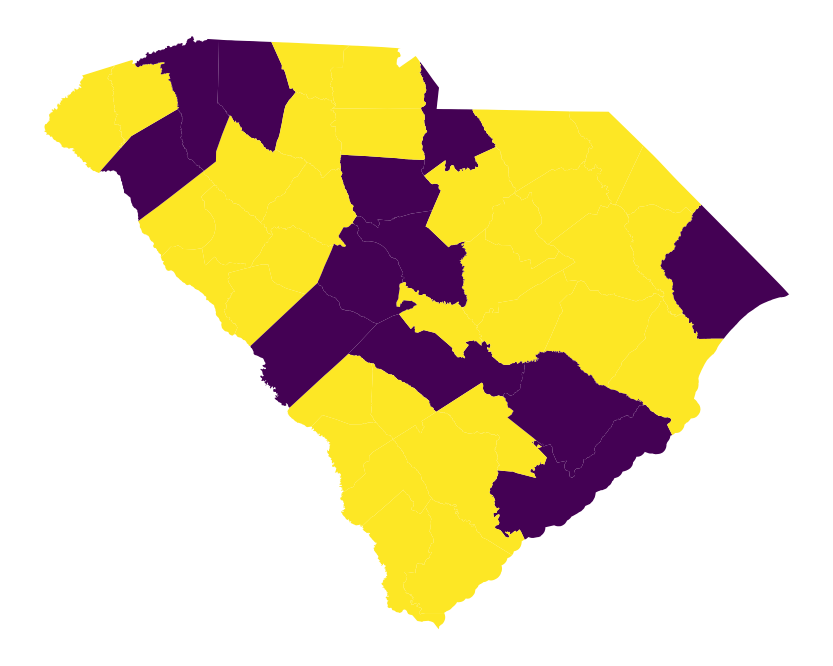

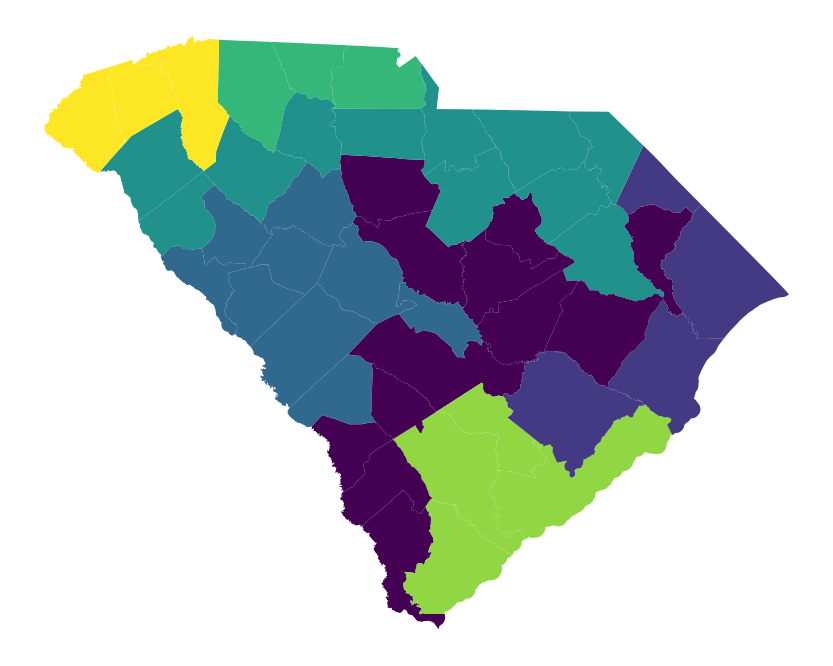

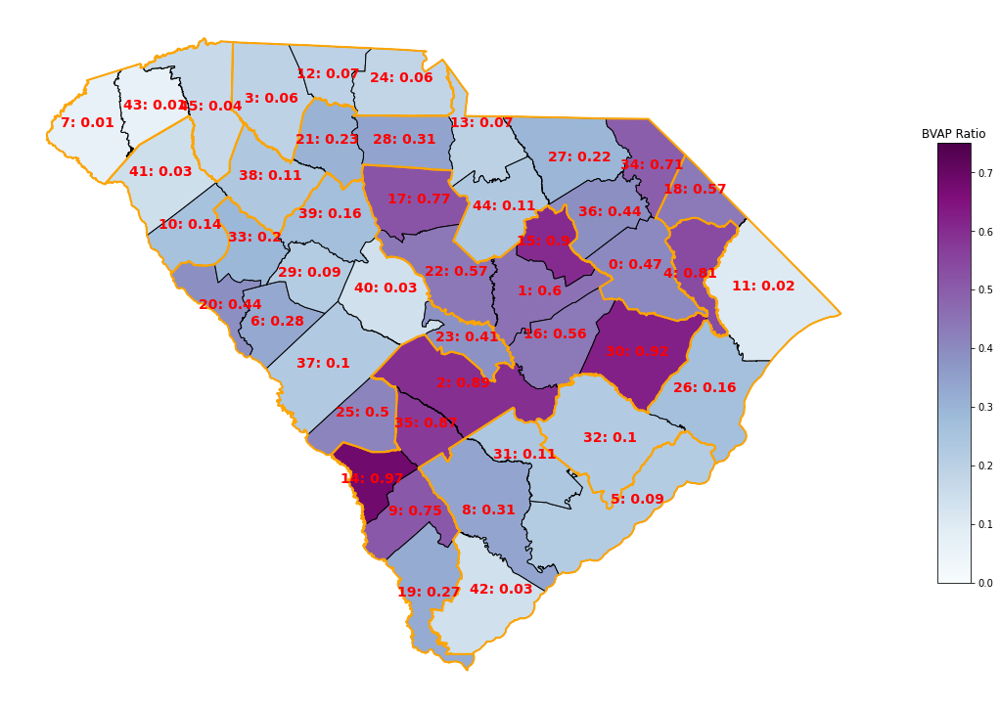

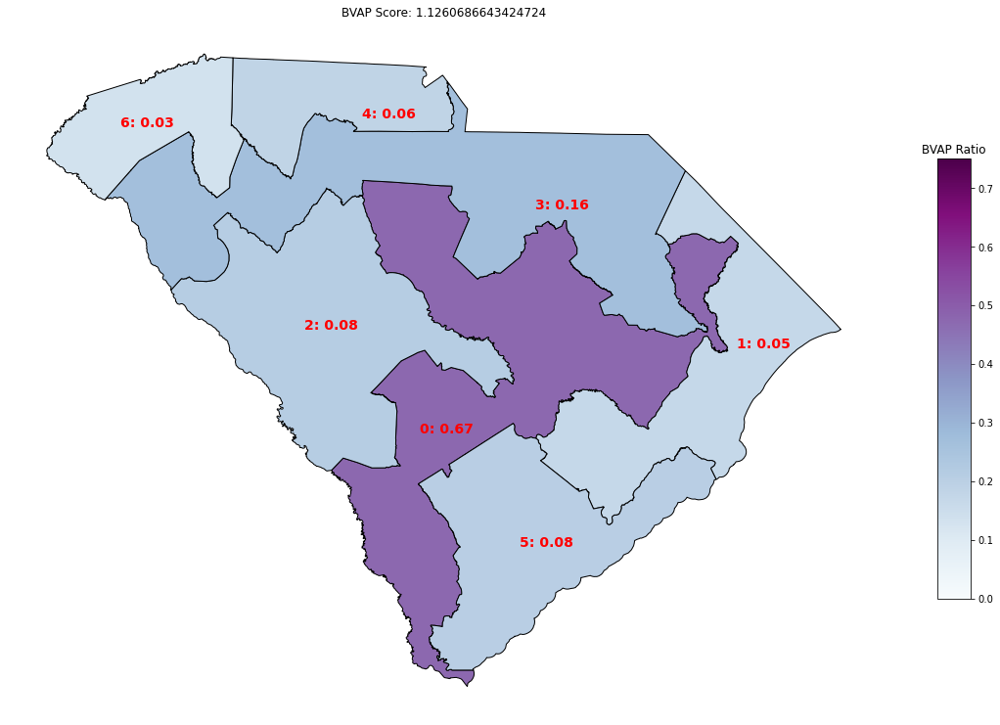

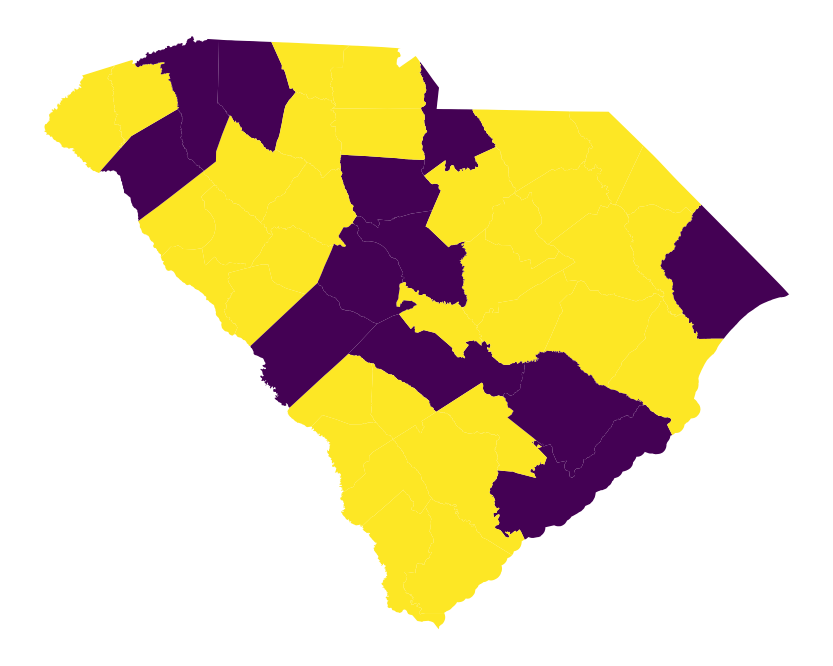

...

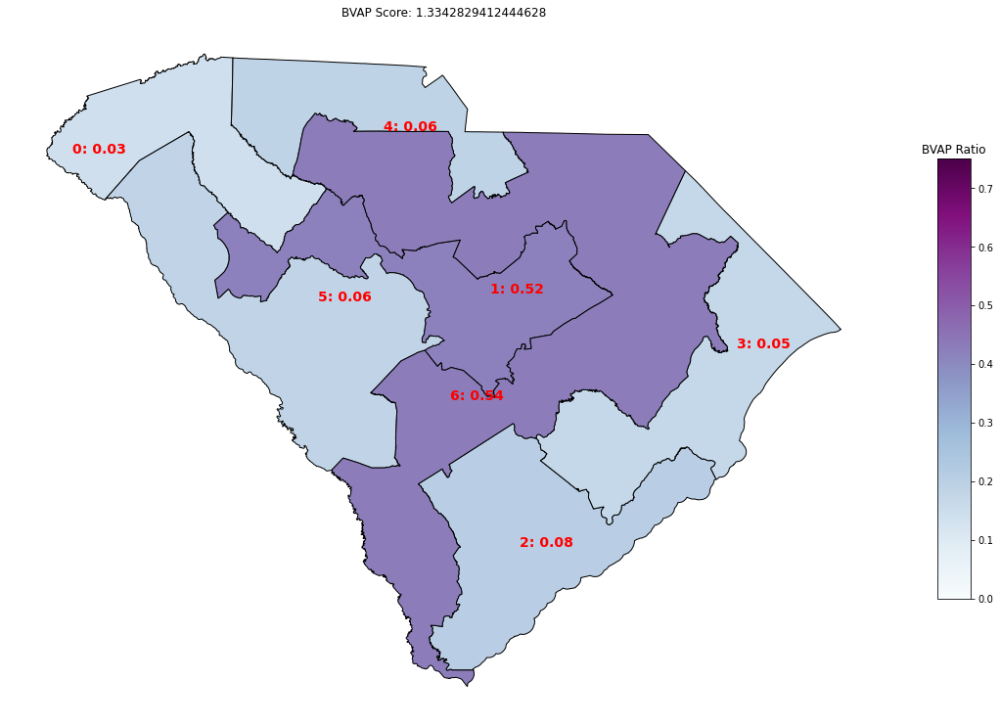

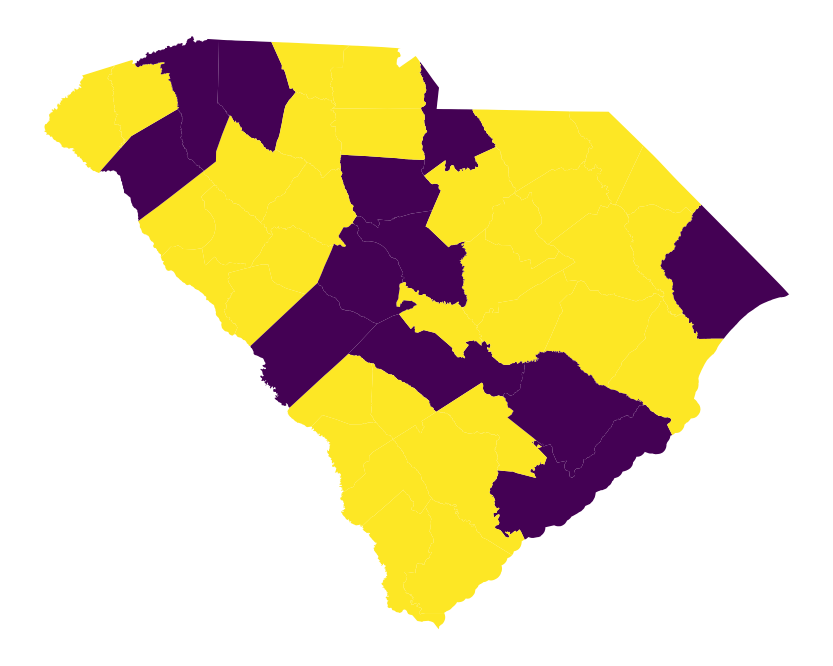

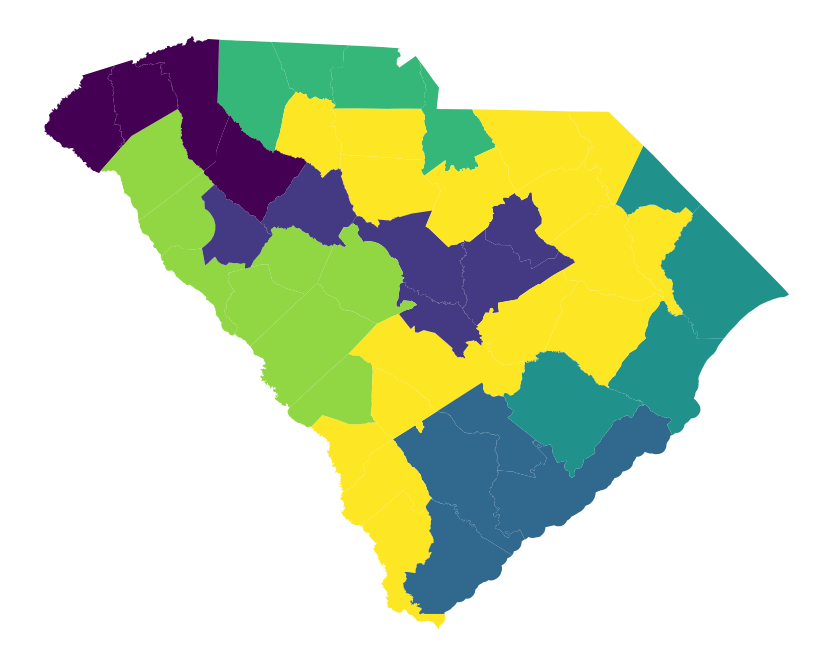

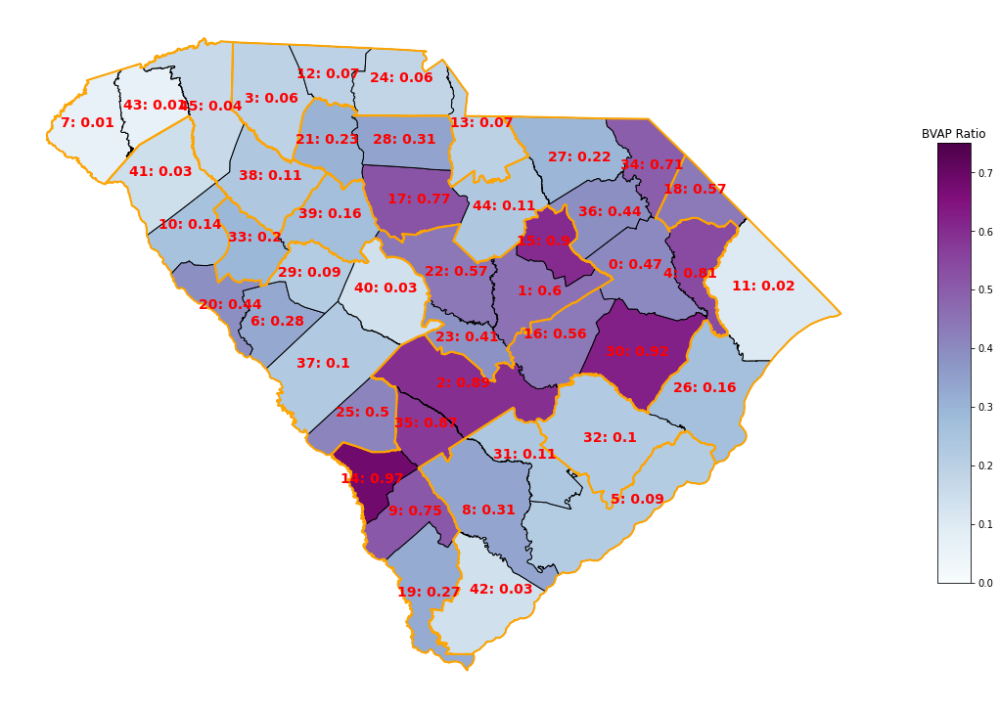

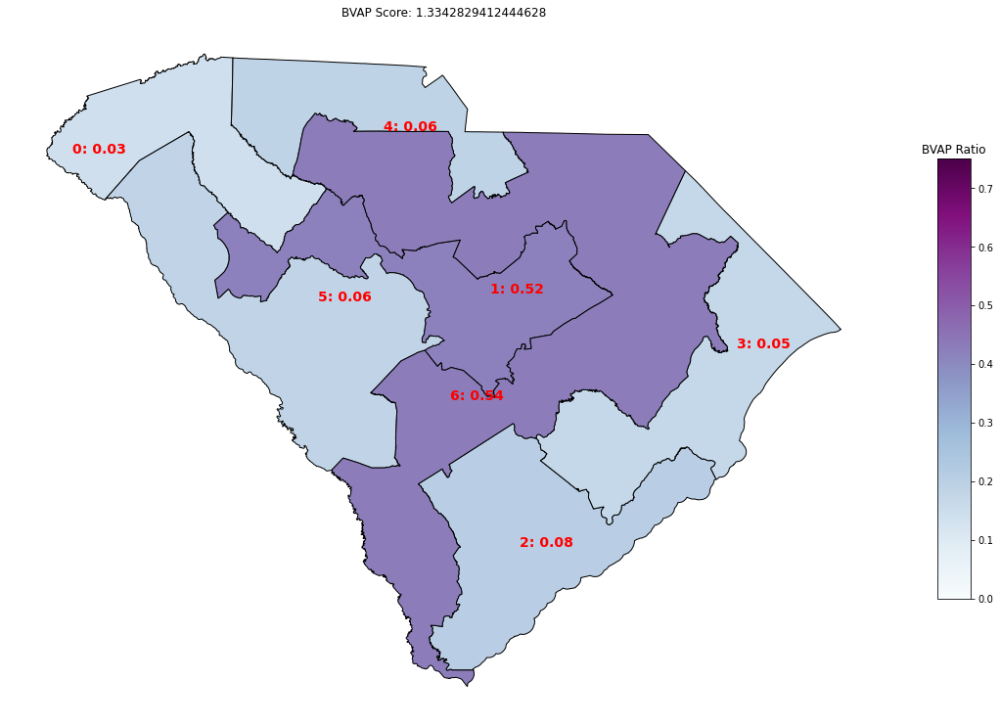

In [1]:
myConfig = 'config-rob-tests-BNPWL.json' # default
myConfig = "config-bvap-bounds_10min.json"
# /###########################
# Imports
###########################  

import gurobipy as gp
from gurobipy import GRB 

import matplotlib.pyplot as plt

from datetime import date
import math
import networkx as nx
import csv
import time
import json
import sys
import os

#from gerrychain import Graph # This functionality was not fully needed here.  It has been replaced by just using networkx.
import geopandas as gpd

# Model imports
import hess, labeling, ordering, fixing, separation
# Plotting and export imports
from my_exports import *



def load_config_data(filename):
    with open(filename, 'r') as file:
        data = json.load(file)
    return data

config_data = load_config_data('config_data.json')

state_codes = config_data['state_codes']
number_of_congressional_districts = config_data['number_of_congressional_districts']
default_config = config_data['default_config']
available_config = config_data['available_config']
available_config['state'] = set(state_codes.keys())
available_config['R'] = int
available_config['fixing'] = set(available_config['fixing'])
available_config['extended'] = set(available_config['extended'])
available_config['heuristic'] = set(available_config['heuristic'])
available_config['lp'] = set(available_config['lp'])



###############################################
# Read configs/inputs and set parameters
############################################### 

# read configs file and load into a Python dictionary

if len(sys.argv)>1:
    # name your own config file in command line, like this: 
    #       python main.py usethisconfig.json
    # to keep logs of the experiments, redirect to file, like this:
    #       python main.py usethisconfig.json 1>>log_file.txt 2>>error_file.txt
    config_filename = sys.argv[1] 
else:
    config_filename = myConfig # default

# Hard Coding the config_filename
if myConfig is not None:
    config_filename = myConfig

print("Reading config from",config_filename)    
config_filename_wo_extension = config_filename.rsplit('.',1)[0]
configs_file = open(config_filename,'r')
batch_configs = json.load(configs_file)
configs_file.close()

# create directory for results
path = os.path.join("..", "results_for_" + config_filename_wo_extension) 
if not os.path.exists(path):
    os.mkdir(path) 

# print results to csv file
today = date.today()
today_string = today.strftime("%Y_%b_%d") # Year_Month_Day, like 2019_Sept_16
results_filename = "../results_for_" + config_filename_wo_extension + "/results_" + config_filename_wo_extension + "_" + today_string + ".csv" 

# prepare csv file by writing column headers
with open(results_filename,'w',newline='') as csvfile:   
    my_fieldnames = ['run','state','level','base','obj','R','tlimit','fixing','contiguity','symmetry','extended','order','heuristic','lp'] # configs
    my_fieldnames += ['k','L','U','n','m'] # params
    my_fieldnames += ['heur_obj', 'heur_time', 'heur_iter'] # heuristic info
    my_fieldnames += ['B_q', 'B_size', 'B_time', 'B_timelimit'] # max B info
    my_fieldnames += ['DFixings', 'LFixings', 'UFixings_X', 'UFixings_R', 'ZFixings'] # fixing info
    my_fieldnames += ['LP_obj', 'LP_time'] # root LP info
    my_fieldnames += ['MIP_obj','MIP_bound','MIP_time', 'MIP_timelimit', 'MIP_status', 'MIP_nodes', 'callbacks', 'lazy_cuts', 'connected'] # MIP info
    my_fieldnames += ['dist_bounds']
    my_fieldnames += ['expected_error','maximum_error']
    writer = csv.DictWriter(csvfile, fieldnames = my_fieldnames)
    writer.writeheader()

    
############################################################
# Run experiments for each config in batch_config file
############################################################

for key in batch_configs.keys(): 
      
    # get config and check for errors
    config = batch_configs[key]
    print("In run",key,"using config:",config,end='.')
    for ckey in available_config.keys():
        if not ckey =='R':
            if config[ckey] not in available_config[ckey]:
                errormessage = "Error: the config option"+ckey+":"+config[ckey]+"is not known."
                sys.exit(errormessage)
    print("")
    
    # fill-in unspecified configs using default values
    for ckey in available_config.keys():
        if ckey not in config.keys():
            print("Using default value",ckey,"=",default_config[ckey],"since no option was selected.")
            config[ckey] = default_config[ckey]
        
    # initialize dictionary to store this run's results
    result = config
    result['run'] = key            
                   
    # read input data from config
    keys_to_extract = ['extended', 'obj', 'R', 'dist_bounds', 'state', 'level', 'base', 'heuristic', 'contiguity', 'obj_order', 'index']
    values = {k: config.get(k) for k in keys_to_extract}
    extended, obj, R, dist_bounds, state, level, base, heuristic, contiguity, obj_order, index = values.values()



    code = state_codes[state]
    print("../data/"+level+"/dual_graphs/"+level+code+".json")
    
    def load_graph_from_json(filename):
        with open(filename, 'r') as file:
            data = json.load(file)
        return nx.json_graph.adjacency_graph(data)

    G = load_graph_from_json(f"../data/{level}/dual_graphs/{level}{code}.json")
    print(G)
    
    DG = nx.DiGraph(G) # bidirected version of G
    

    # set parameters
    k = number_of_congressional_districts[state]        
    population = {node : G.nodes[node]['POP100'] for node in G.nodes()}  
    deviation = .2
    L = math.ceil((1-deviation/2)*sum(population[node] for node in G.nodes())/k)
    U = math.floor((1+deviation/2)*sum(population[node] for node in G.nodes())/k)
    print("L =",L,", U =",U,", k =",k)
    result['k'] = k
    result['L'] = L
    result['U'] = U
    result['m'] = G.number_of_edges()
    result['n'] = G.number_of_nodes()
    
    # abort early for trivial or overtly infeasible instances
    maxp = max(population[i] for i in G.nodes)
    if k==1 or maxp>U:
        print("k=",k,", max{ p_v | v in V } =",maxp,", U =",U,end='.')
        sys.exit("Aborting early, either due to trivial instance or overtly infeasible instance.")
           
    # read heuristic solution from external file (?)
    result['heur_obj'] = 'n/a'
    result['heur_time'] = 'n/a'
    result['heur_iter'] = 'n/a'
        
          
    ############################
    # Build base model
    ############################   
    
    m = gp.Model()
    m._DG = DG
    
    if base == 'hess':
        # X[i,j]=1 if vertex i is assigned to (district centered at) vertex j
        m._X = m.addVars(DG.nodes, DG.nodes, vtype=GRB.BINARY)
        hess.add_base_constraints(m, population, L, U, k)
    
    if base == 'labeling':        
        # X[i,j]=1 if vertex i is assigned to district j in {0,1,2,...,k-1}
        m._X = m.addVars(DG.nodes, range(k), vtype=GRB.BINARY, name="X")
        if config['symmetry']=='orbitope' or config['contiguity'] in {'scf', 'shir', 'lcut'}:
            m._R = m.addVars(DG.nodes, range(k), vtype=GRB.BINARY)
        labeling.add_base_constraints(m, population, L, U, k)

                
    ############################################
    # Add (extended?) objective 
    ############################################

    
    if base == 'hess':
        if extended:
            hess.add_extended_objective(m, G)
        else:
            hess.add_objective(m, G)
    print(config)
    
    if base == 'labeling':
        # Load the JSON file
        with open('objective_functions.json', 'r') as f:
            obj_func_data = json.load(f)

        # Create the objective_functions dictionary and the start_labels dictionary
        objective_functions = {}
        start_labels = {}
        for name, data in obj_func_data.items():
            objective_functions[name] = getattr(labeling, data['function'])
            start_labels[name] = data['start_label']
            
        if obj in objective_functions:
            if 'bounds' not in obj:
                function_result = objective_functions[obj](m, G, k, R, U)
            if 'bounds' in obj:
                function_result = objective_functions[obj](m, G, k, R, U, obj_order,index)
            
#         if obj in start_labels:
#             start_label = start_labels[obj]
#             if start_label is not None and heuristic:
#                 # create list of nodes in each district
#                 heuristic_districts = [[node for node in G.nodes if G.nodes[node][start_label] == j + 1] for j in range(k)]
#             else:
#                 heuristic_districts = None

            heuristic_districts = None
            def get_filename(state, string):
                obj_name = string.split("start_", 1)[1]
                filename = f"../results/objective_sorted/{state}_{obj_name}_sorted.csv"

                with open(filename) as f:
                    # skip header
                    next(f)
                    # return first non-empty line
                    for line in f:
                        if line.strip():
                            return line.split(",")[0].strip()

                # if no non-empty line was found, return None
                return None


            if obj in start_labels:
                filename_warm_start = get_filename(state, data['start_label'])
                heuristic_districts = None
                if filename_warm_start is not None:
                    print(f"Loading best known solution from {filename_warm_start}")
                    with open(filename_warm_start, 'r') as f:
                        data = json.load(f)

                    # create a dictionary with district keys and GEOID values
                    districts = {}
                    for node in data['nodes']:
                        district = node['district']
                        geoid = node['GEOID']
                        if district not in districts:
                            districts[district] = []
                        districts[district].append(geoid)

                    # create a dictionary with district keys and a list of graph indices as values
                    district_indices = {}
                    for node in G.nodes:
                        geoid = G.nodes[node]['GEOID']
                        for district, geoids in districts.items():
                            if geoid in geoids:
                                if district not in district_indices:
                                    district_indices[district] = []
                                district_indices[district].append(node)

                    print(district_indices) 
                    heuristic_districts = district_indices
    
    ####################################   
    # Contiguity constraints
    ####################################      
            
    m._callback = None
    m._population = population
    m._U = U
    m._k = k
    m._base = base
    m._numLazyCuts = 0
    m._numCallbacks = 0
    
    if base == 'hess':
        if contiguity == 'shir':
            hess.add_shir_constraints(m)
        elif contiguity == 'scf':
            hess.add_scf_constraints(m, G, extended)
        elif contiguity == 'lcut':
            m.Params.lazyConstraints = 1
            m._callback = separation.lcut_separation_generic
                    
    if base == 'labeling':
        if contiguity == 'shir':
            labeling.add_shir_constraints(m, config['symmetry'])
        elif contiguity == 'scf':
            labeling.add_scf_constraints(m, G, extended, config['symmetry'])
        elif contiguity == 'lcut':
            m.Params.lazyConstraints = 1
            m._callback = separation.lcut_separation_generic 
         
    m.update()
    
    
    ############################################
    # Vertex ordering and max B problem 
    ############################################  
        
    order = config['order']
    
    if order == 'B_decreasing':
        (B, result['B_q'], result['B_time'], result['B_timelimit']) = ordering.solve_maxB_problem(DG, population, L, k, heuristic_districts)
        
        # draw set B on map and save
        fn_B = "../" + "results_for_" + config_filename_wo_extension + "/" + result['state'] + "-" + result['level'] + "-maxB.png"
        
        # read shapefile
        gdf = gpd.read_file("../data/"+level+"/shape_files/"+state+"_"+level+".shp")
        print("Order is B decreasing, so we made a plot...")
        export_B_to_png(G, gdf, B, fn_B)
    else:
        (B, result['B_q'], result['B_time'], result['B_timelimit']) = (list(),'n/a','n/a', 'n/a')
        
    result['B_size'] = len(B)
    
    vertex_ordering = ordering.find_ordering(order, B, DG, population)
    position = ordering.construct_position(vertex_ordering)
    
    print("Vertex ordering =", vertex_ordering)  
    print("Position vector =", position)
    print("Set B =", B)

    ####################################   
    # Symmetry handling
    ####################################    
    
    symmetry = config['symmetry']
    
    if symmetry == 'aggressive':
        m.Params.symmetry = 2
    elif symmetry == 'orbitope':
        if base == 'labeling':
            labeling.add_orbitope_extended_formulation(m, G, k, vertex_ordering)
        else:
            sys.exit("Error: orbitope only available for labeling base model.")     
    
    m.Params.symmetry = 0
            
    ####################################   
    # Variable fixing
    ####################################    
    
    do_fixing = config['fixing']
    
    if do_fixing and base == 'hess':
        result['DFixings'] = fixing.do_Hess_DFixing(m, G, position)
        result['UFixings_R'] = 'n/a'
        
        if contiguity == 'none':
            result['LFixings'] = fixing.do_Hess_LFixing_without_Contiguity(m, G, population, L, vertex_ordering)
            result['UFixings_X'] = fixing.do_Hess_UFixing_without_Contiguity(m, G, population, U)
        else:
            result['LFixings'] = fixing.do_Hess_LFixing(m, G, population, L, vertex_ordering)
            result['UFixings_X'] = fixing.do_Hess_UFixing(m, DG, population, U, vertex_ordering)         
        
        if extended:
            result['ZFixings'] = fixing.do_Hess_ZFixing(m, G)
        else:
            result['ZFixings'] = 0
                
    
    if do_fixing and base == 'labeling':
        result['DFixings'] = fixing.do_Labeling_DFixing(m, G, vertex_ordering, k)
        
        if contiguity == 'none':
            if symmetry == 'orbitope':
                result['LFixings'] = fixing.do_Labeling_LFixing_without_Contiguity(m, G, population, L, vertex_ordering, k)
            else:
                result['LFixings'] = 0
            (result['UFixings_X'], result['UFixings_R']) = fixing.do_labeling_UFixing_without_Contiguity()
        else:
            result['LFixings'] = fixing.do_Labeling_LFixing(m, G, population, L, vertex_ordering, k)
            (result['UFixings_X'], result['UFixings_R']) = fixing.do_Labeling_UFixing(m, DG, population, U, vertex_ordering, k)
        
        if extended:
            result['ZFixings'] = fixing.do_Labeling_ZFixing(m, G, k)
        else:
            result['ZFixings'] = 0
            
    if not do_fixing:
        result['DFixings'] = 0
        result['UFixings_R'] = 0
        result['LFixings'] = 0
        result['UFixings_X'] = 0
        result['ZFixings'] = 0
            
    
    ######################################################################################
    # Solve root LP? Used only for reporting purposes. Not used for MIP solve.
    ######################################################################################  
    
    if config['lp']:
        r = m.relax() # LP relaxation of MIP model m
        r.Params.LogToConsole = 0 # keep log to a minimum
        r.Params.Method = 3 # use concurrent LP solver
        r.Params.TimeLimit = 3600 # one-hour time limit for solving LP
        print("To get the root LP bound, now solving a (separate) LP model.")
        
        lp_start = time.time()
        r.optimize()
        lp_end = time.time()
        
        if r.status == GRB.OPTIMAL:
            result['LP_obj'] = '{0:.2f}'.format(r.objVal)
        elif r.status == GRB.TIME_LIMIT:
            result['LP_obj'] = 'TL'
        else:
            result['LP_obj'] = '?'
        result['LP_time'] = '{0:.2f}'.format(lp_end - lp_start)
        
    else:
        result['LP_obj'] = 'n/a'
        result['LP_time'] = 'n/a'
        
    
    ####################################   
    # Inject heuristic warm start
    ####################################    
    
    if heuristic and base == 'hess':
        for district in heuristic_districts:    
            p = min([position[v] for v in district])
            j = vertex_ordering[p]
            for i in district:
                m._X[i,j].start = 1
               
    print("\n start stuff \n")            
    if heuristic and base == 'labeling':
        # m.read("ordering test_4.sol");

        # m.update();
#         flag = 0
#         for i in G.nodes:
#             count = 0
#             for nodes in heuristic_districts:
#                 if i in nodes:
#                     count = count+1
#             if count != 1:
#                 print(i, count)
#                 flag = 1
#         if flag:
#             print("Error")
                
            
                
        # for i,nodes in enumerate(heuristic_districts):
        #     for node in nodes:
        #         m._X[node,i].start = int(1)
                
        #         for j in range(k):
        #             if i != j:
        #                 m._X[node,j].start = 0
        
        # read in the JSON file
       
            
        center_positions = [ min( position[v] for v in heuristic_districts[j] ) for j in range(k) ] 
        cplabel = { center_positions[j] : j for j in range(k) }
    
        # what node r will root the new district j? The one with earliest position.
        for j in range(k):
            min_cp = min(center_positions)
            r = vertex_ordering[min_cp]
            old_j = cplabel[min_cp]
            
            for i in heuristic_districts[old_j]:
                m._X[i,j].start = 1
                
            center_positions.remove(min_cp)
                
    
    ####################################   
    # Solve MIP
    ####################################  
    
    result['MIP_timelimit'] = config['tlimit'] 
    m.Params.TimeLimit = result['MIP_timelimit']
    m.Params.Method = 3 # use concurrent method for root LP. Useful for degenerate models
    
    fn = "../" + "results_for_" + config_filename_wo_extension + "/" + result['state'] + "-" + result['level'] + "-" + config['obj'] + "-" + str(config['R'])
    m.params.LogFile= fn+".log"
    
#     if len(sys.argv)>2:
#         if sys.argv[2] == 'show':
#             print("Showing log")
#     else:
#         m.setParam('LogToConsole', 0)
    
    #m.setParam('LogToConsole', 0)
    start = time.time()
    m.optimize(m._callback)
    end = time.time()
    
    print(fn)
    
    if obj == "bvap_bounds":
        fn = fn + "_" + obj_order + "_" + str(index)
    
    # Check if expErr and maxErr are defined
    print("Summarizing the results for export")
    if 'expErr' in locals() and 'maxErr' in locals():
        # Call the function with expErr and maxErr
        summarize_results(result, m, G, DG, k, fn, level, state, base, obj, start, end, expErr=expErr, maxErr=maxErr, results_filename=results_filename, my_fieldnames=my_fieldnames)
    else:
        # Call the function without expErr and maxErr
        summarize_results(result, m, G, DG, k, fn, level, state, base, obj, start, end, results_filename=results_filename, my_fieldnames=my_fieldnames)

    

In [5]:
'eraerae'[-5:]!='.json'

True

In [6]:
'eraerae'+'.json'

'eraerae.json'

In [1]:
myfile = '../results_for_config-bvap-bounds_10min/results_config-bvap-bounds_10min_2023_Apr_18.csv'

In [5]:
import pandas as pd

# Read CSV file into dataframe
df = pd.read_csv(myfile)

# Display the first 5 rows of the dataframe
df.keys()

Index(['run', 'state', 'level', 'base', 'obj', 'R', 'tlimit', 'fixing',
       'contiguity', 'symmetry', 'extended', 'order', 'heuristic', 'lp', 'k',
       'L', 'U', 'n', 'm', 'heur_obj', 'heur_time', 'heur_iter', 'B_q',
       'B_size', 'B_time', 'B_timelimit', 'DFixings', 'LFixings', 'UFixings_X',
       'UFixings_R', 'ZFixings', 'LP_obj', 'LP_time', 'MIP_obj', 'MIP_bound',
       'MIP_time', 'MIP_timelimit', 'MIP_status', 'MIP_nodes', 'callbacks',
       'lazy_cuts', 'connected', 'dist_bounds', 'expected_error',
       'maximum_error'],
      dtype='object')

In [9]:
df

,,run,state,level,base,obj,R,tlimit,fixing,contiguity,symmetry,...,MIP_time,MIP_timelimit,MIP_status,MIP_nodes,callbacks,lazy_cuts,connected,dist_bounds,expected_error,maximum_error
SC_bvap_0_max,SC,county,labeling,bvap_bounds,90,600,False,lcut,default,False,B_decreasing,...,9,495641,467,3299,True,False,NaN,NaN,bvap_max,0
SC_bvap_1_max,SC,county,labeling,bvap_bounds,90,600,False,lcut,default,False,B_decreasing,...,2,196713,339,2384,True,False,NaN,NaN,bvap_max,1
SC_bvap_2_max,SC,county,labeling,bvap_bounds,90,600,False,lcut,default,False,B_decreasing,...,9,490803,594,4037,True,False,NaN,NaN,bvap_max,2
SC_bvap_3_max,SC,county,labeling,bvap_bounds,90,600,False,lcut,default,False,B_decreasing,...,9,286150,440,3270,True,False,NaN,NaN,bvap_max,3
SC_bvap_4_max,SC,county,labeling,bvap_bounds,90,600,False,lcut,default,False,B_decreasing,...,9,306121,556,3922,True,False,NaN,NaN,bvap_max,4
SC_bvap_5_max,SC,county,labeling,bvap_bounds,90,600,False,lcut,default,False,B_decreasing,...,9,311600,523,3603,True,False,NaN,NaN,bvap_max,5
SC_bvap_6_max,SC,county,labeling,bvap_bounds,90,600,False,lcut,default,False,B_decreasing,...,2,214089,344,2349,True,False,NaN,NaN,bvap_max,6
SC_bvap_0_min,SC,county,labeling,bvap_bounds,90,600,False,lcut,default,False,B_decreasing,...,2,1629,35,533,True,False,NaN,NaN,bvap_min,0
SC_bvap_1_min,SC,county,labeling,bvap_bounds,90,600,False,lcut,default,False,B_decreasing,...,2,123097,481,3865,True,False,NaN,NaN,bvap_min,1
SC_bvap_2_min,SC,county,labeling,bvap_bounds,90,600,False,lcut,default,False,B_decreasing,...,2,4022,128,1632,True,False,NaN,NaN,bvap_min,2


In [8]:
df[['LFixings', 'UFixings_X',
       'UFixings_R', 'ZFixings', 'LP_obj', 'LP_time', 'MIP_obj', 'MIP_bound',
       'MIP_time', 'MIP_timelimit', 'MIP_status', 'MIP_nodes', 'callbacks',
       'lazy_cuts', 'connected']]

,,LFixings,UFixings_X,UFixings_R,ZFixings,LP_obj,LP_time,MIP_obj,MIP_bound,MIP_time,MIP_timelimit,MIP_status,MIP_nodes,callbacks,lazy_cuts,connected
SC_bvap_0_max,SC,0,0,NaN,NaN,302666.0,304582.0,600.68,600,9,495641,467,3299,True,False,NaN
SC_bvap_1_max,SC,0,0,NaN,NaN,302666.0,302666.0,149.54,600,2,196713,339,2384,True,False,NaN
SC_bvap_2_max,SC,0,0,NaN,NaN,302666.0,304582.0,600.49,600,9,490803,594,4037,True,False,NaN
SC_bvap_3_max,SC,0,0,NaN,NaN,302666.0,304582.0,600.38,600,9,286150,440,3270,True,False,NaN
SC_bvap_4_max,SC,0,0,NaN,NaN,302666.0,304582.0,601.14,600,9,306121,556,3922,True,False,NaN
SC_bvap_5_max,SC,0,0,NaN,NaN,302666.0,304582.0,600.35,600,9,311600,523,3603,True,False,NaN
SC_bvap_6_max,SC,0,0,NaN,NaN,302666.0,302666.0,292.59,600,2,214089,344,2349,True,False,NaN
SC_bvap_0_min,SC,0,0,NaN,NaN,77028.0,77028.0,1.37,600,2,1629,35,533,True,False,NaN
SC_bvap_1_min,SC,0,0,NaN,NaN,77028.0,77028.0,122.30,600,2,123097,481,3865,True,False,NaN
SC_bvap_2_min,SC,0,0,NaN,NaN,77028.0,77028.0,5.30,600,2,4022,128,1632,True,False,NaN


In [ ]:
from main import *
main()